# Problem Statement:

Telecommunications companies face a significant challenge with customer churn, with annual rates often exceeding 10%. To mitigate this issue, the objective is to develop a classification model that predicts customer churn based on various features. The goal is to model the probability of churn, given customer attributes, in order to implement targeted retention strategies.

# Data Set Details:

The dataset comprises information about individual clients, including the state, account details, usage patterns, and service charges. The key variables include:

● state: Categorical, for the 51 states and the District of Columbia.

● Area.code

● account.length: how long the account has been active.

● voice.plan: yes or no, voicemail plan.

● voice.messages: number of voicemail messages.

● intl.plan: yes or no, international plan.

● intl.mins: minutes customer used service to make international calls.

● intl.calls: total number of international calls.

● intl.charge: total international charge.

● day.mins: minutes customer used service during the day.

● day.calls: total number of calls during the day.

● day.charge: total charge during the day.

● eve.mins: minutes customer used service during the evening.

● eve.calls: total number of calls during the evening.

● eve.charge: total charge during the evening.

● night.mins: minutes customer used service during the night.

● night.calls: total number of calls during the night.

● night.charge: total charge during the night.

● customer.calls: number of calls to customer service.

● churn: Categorical, yes or no. Indicator of whether the customer has left the company (yes or no).

## Blueprint:

## Objective:
Develop a classification model to predict customer churn based on the provided dataset.

# Steps:

## Data Exploration and Preprocessing:

Explore the dataset to understand distributions and patterns.

Handle missing values and outliers.

Encode categorical variables.

Split the dataset into training and testing sets.

## Feature Engineering:

Identify relevant features for predicting churn.

Create new features if necessary.

Normalize or scale numerical features.

## Model Selection:

Choose appropriate classification algorithms (e.g., logistic regression, decision trees, random forests, or gradient boosting).

Evaluate and compare models using metrics such as accuracy, precision, recall, and F1-score.

## Model Training:

Train the selected model(s) on the training dataset.

Tune hyperparameters for optimal performance.

## Model Evaluation:

Evaluate the model on the testing dataset using relevant metrics.

Analyze confusion matrix to understand false positives and false negatives.

## Deployment:

Develop a web application using Flask or Streamlit for end-users to interact with the model.

Deploy the model and application on a server or cloud platform.

## Documentation:

Create comprehensive documentation for the model, including data preprocessing steps, feature engineering, model selection, and deployment instructions.

## Monitoring and Maintenance:

Implement a monitoring system to track model performance in real-time.

Establish a plan for regular model updates and maintenance.

## Acceptance Criterion:
The final product should be a deployed web application using Flask or Streamlit, allowing users to input customer features and receive predictions for churn probability. The application should provide a user-friendly interface and demonstrate accurate predictions based on the chosen model.

## Importing required libraries:

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick # For specifying the axes tick format
import seaborn as sns
from sklearn.preprocessing import LabelEncoder

In [2]:
#Ignore warnings:

import warnings
warnings.filterwarnings("ignore")

## Importing required dataset:

In [3]:
#from google.colab import files
#uploaded=files.upload()

ModuleNotFoundError: No module named 'google'

In [4]:
#Code for reading the dataset:

df=pd.read_excel(r"F:\excelR ds\Project excelR\Churn.xlsx",index_col=0,na_values='Nan')

#dataset:

df

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
1,KS,area_code_415,128,yes,25,no,10.0,3,2.70,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,1,no
2,OH,area_code_415,107,yes,26,no,13.7,3,3.70,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,1,no
3,NJ,area_code_415,137,no,0,no,12.2,5,3.29,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,0,no
4,OH,area_code_408,84,no,0,yes,6.6,7,1.78,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,2,no
5,OK,area_code_415,75,no,0,yes,10.1,3,2.73,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,3,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4996,HI,area_code_408,50,yes,40,no,9.9,5,2.67,235.7,127,40.07,223.0,126,18.96,297.5,116,13.39,2,no
4997,WV,area_code_415,152,no,0,no,14.7,2,3.97,184.2,90,31.31,256.8,73,21.83,213.6,113,9.61,3,yes
4998,DC,area_code_415,61,no,0,no,13.6,4,3.67,140.6,89,23.90,172.8,128,14.69,212.4,97,9.56,1,no
4999,DC,area_code_510,109,no,0,no,8.5,6,2.30,188.8,67,32.10,171.7,92,14.59,224.4,89,10.10,0,no


In [5]:
df1=df.copy()

## Performing EDA:

In [6]:
df.shape

(5000, 20)

In [7]:
df.rename(columns={'area.code': 'area_code','account.length':'account_length', 'voice.plan': 'voice_plan', 'voice.messages': 'voice_messages','intl.plan':'intl_plan','intl.mins':'intl_mins','intl.calls':'intl_calls','intl.charge':'intl_charge','day.mins':'day_mins','day.calls':'day_calls','day.charge':'day_charge','eve.mins':'eve_mins','eve.mins':'eve_mins','eve.calls':'eve_calls','eve.charge':'eve_charge','night.mins':'night_mins','night.calls':'night_calls','night.charge':'night_charge','customer.calls':'customer_calls'}, inplace=True)

In [8]:
df.head()

,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn
1,KS,area_code_415,128,yes,25,no,10.0,3,2.70,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,1,no
2,OH,area_code_415,107,yes,26,no,13.7,3,3.70,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,1,no
3,NJ,area_code_415,137,no,0,no,12.2,5,3.29,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,0,no
4,OH,area_code_408,84,no,0,yes,6.6,7,1.78,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,2,no
5,OK,area_code_415,75,no,0,yes,10.1,3,2.73,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,3,no


In [9]:
df.tail()

,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn
4996,HI,area_code_408,50,yes,40,no,9.9,5,2.67,235.7,127,40.07,223.0,126,18.96,297.5,116,13.39,2,no
4997,WV,area_code_415,152,no,0,no,14.7,2,3.97,184.2,90,31.31,256.8,73,21.83,213.6,113,9.61,3,yes
4998,DC,area_code_415,61,no,0,no,13.6,4,3.67,140.6,89,23.90,172.8,128,14.69,212.4,97,9.56,1,no
4999,DC,area_code_510,109,no,0,no,8.5,6,2.30,188.8,67,32.10,171.7,92,14.59,224.4,89,10.10,0,no
5000,VT,area_code_415,86,yes,34,no,9.3,16,2.51,129.4,102,22.00,267.1,104,22.70,154.8,100,6.97,0,no


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5000 entries, 1 to 5000
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   state           5000 non-null   object 
 1   area_code       5000 non-null   object 
 2   account_length  5000 non-null   int64  
 3   voice_plan      5000 non-null   object 
 4   voice_messages  5000 non-null   int64  
 5   intl_plan       5000 non-null   object 
 6   intl_mins       5000 non-null   float64
 7   intl_calls      5000 non-null   int64  
 8   intl_charge     5000 non-null   float64
 9   day_mins        5000 non-null   float64
 10  day_calls       5000 non-null   int64  
 11  day_charge      4993 non-null   float64
 12  eve_mins        4976 non-null   float64
 13  eve_calls       5000 non-null   int64  
 14  eve_charge      5000 non-null   float64
 15  night_mins      5000 non-null   float64
 16  night_calls     5000 non-null   int64  
 17  night_charge    5000 non-null   f

## Finding missing/null values:

In [11]:
df.isnull().sum()

state              0
area_code          0
account_length     0
voice_plan         0
voice_messages     0
intl_plan          0
intl_mins          0
intl_calls         0
intl_charge        0
day_mins           0
day_calls          0
day_charge         7
eve_mins          24
eve_calls          0
eve_charge         0
night_mins         0
night_calls        0
night_charge       0
customer_calls     0
churn              0
dtype: int64

<Axes: >

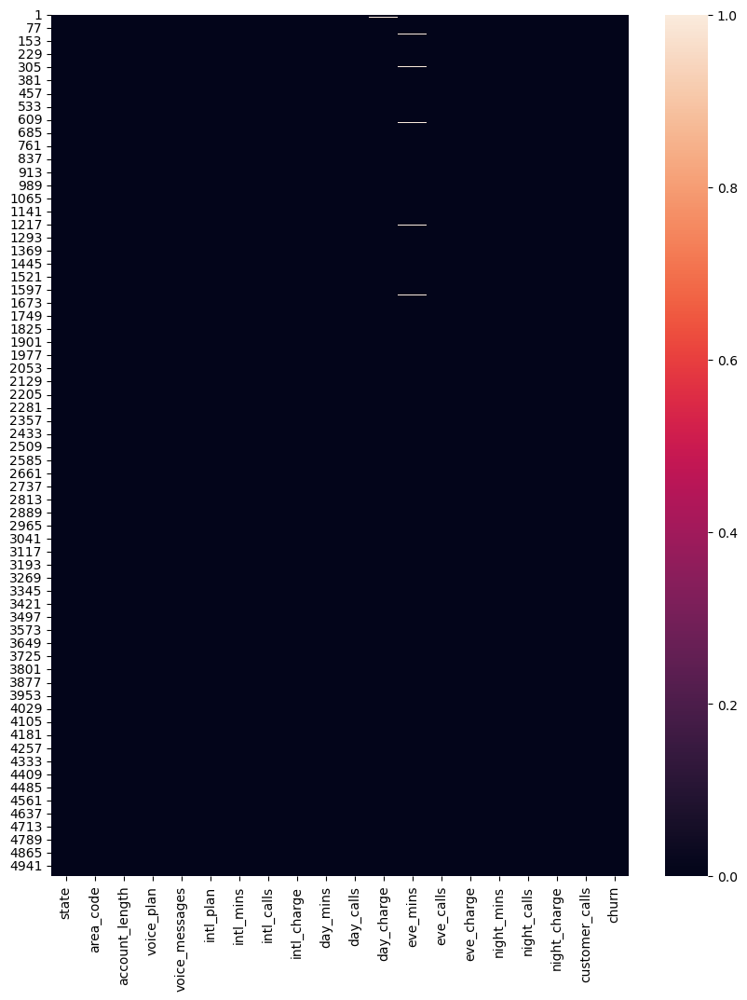

In [12]:
plt.figure(figsize=(10,12))
sns.heatmap(df.isnull())

In [13]:
df["day_charge"].fillna(df["day_charge"].median(),inplace=True)
df["eve_mins"].fillna(df["eve_mins"].median(),inplace=True)

In [14]:
df.isnull().sum()

state             0
area_code         0
account_length    0
voice_plan        0
voice_messages    0
intl_plan         0
intl_mins         0
intl_calls        0
intl_charge       0
day_mins          0
day_calls         0
day_charge        0
eve_mins          0
eve_calls         0
eve_charge        0
night_mins        0
night_calls       0
night_charge      0
customer_calls    0
churn             0
dtype: int64

As shown above, the data set contains 5000 observations and 21 columns. Apparently, there are no null values on the data set.

<Axes: >

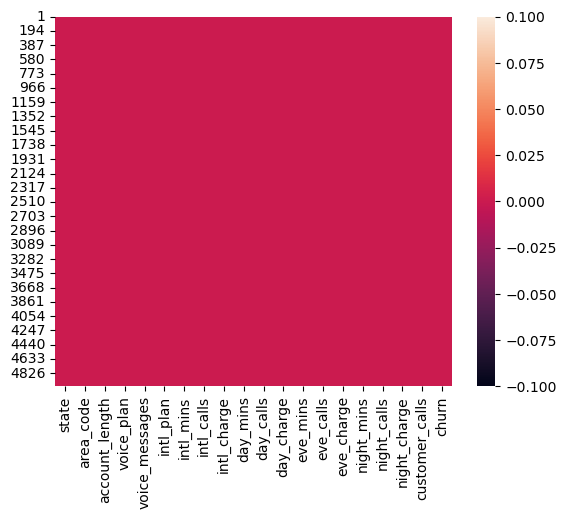

In [15]:
sns.heatmap(df.isnull())

## Outlier Detection and Handling:

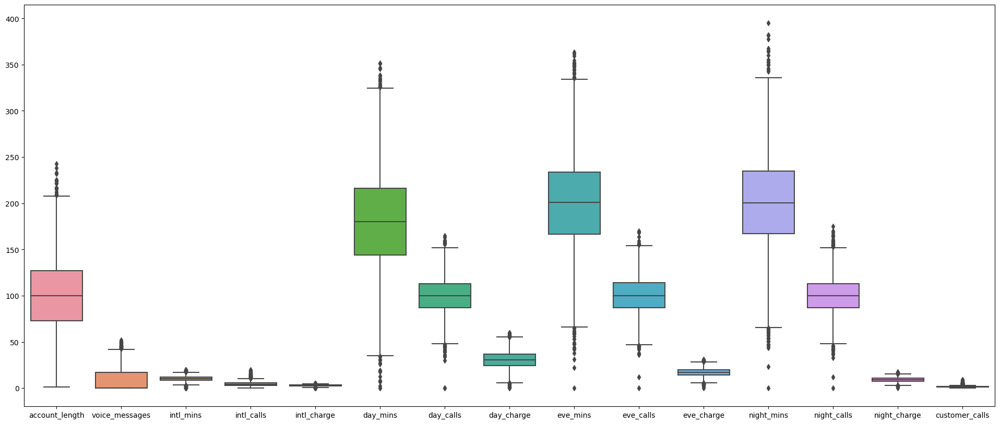

In [16]:
plt.figure(figsize=(24,10))
sns.boxplot(data=df)
plt.show()

In [17]:
numerical_columns=df.select_dtypes(include=['int64','float64'])

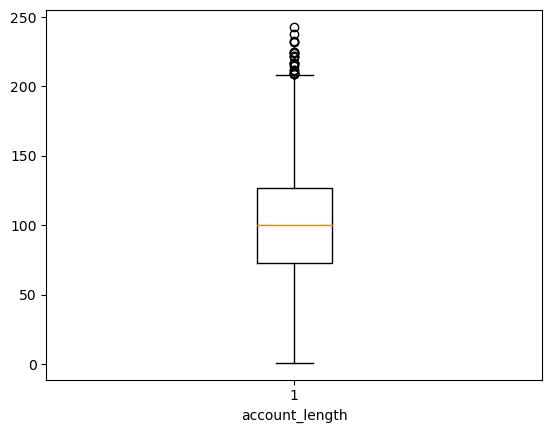

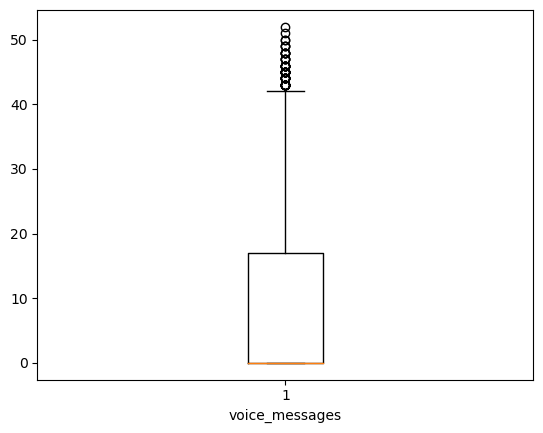

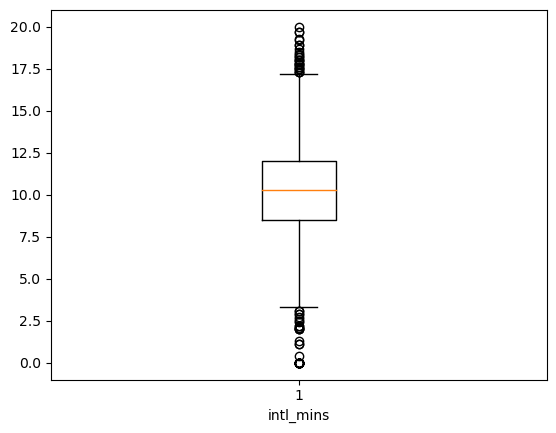

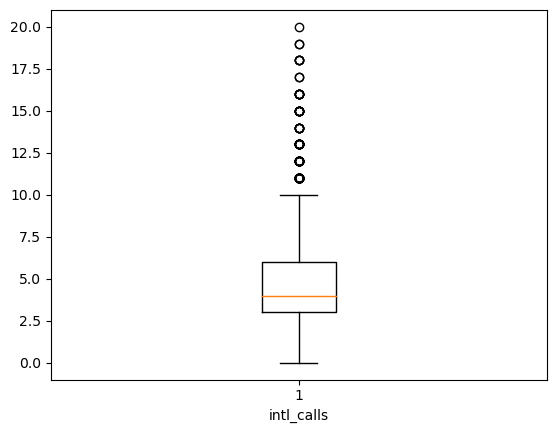

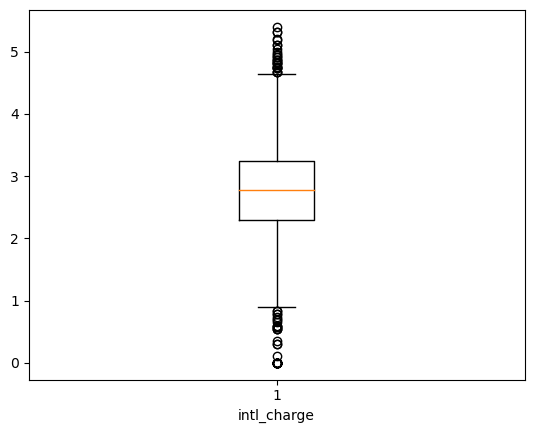

...

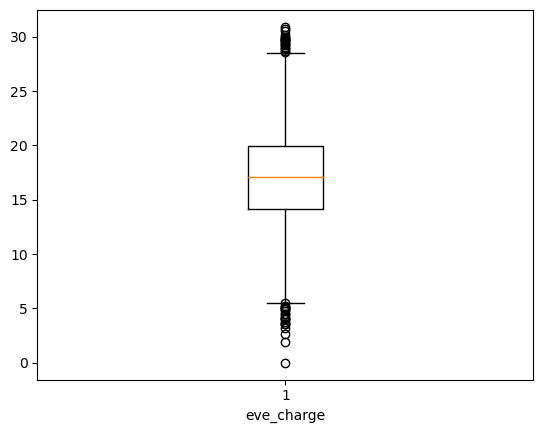

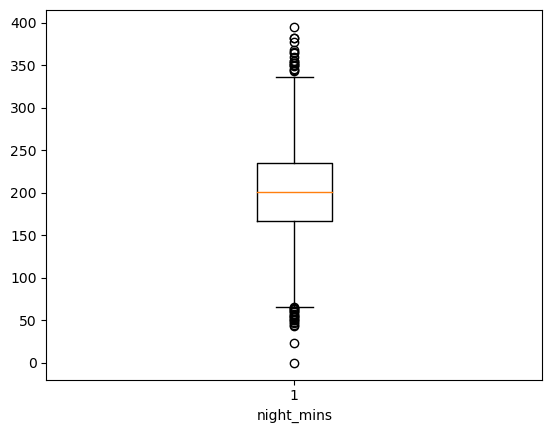

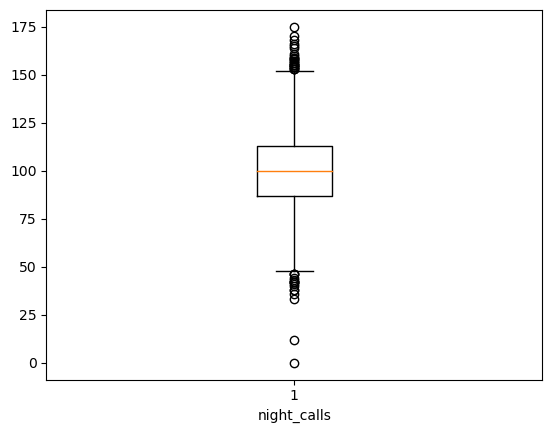

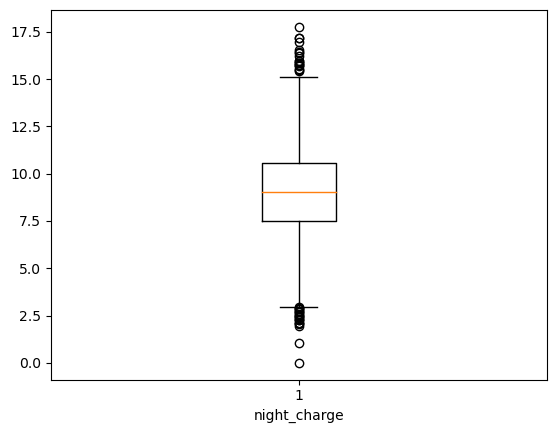

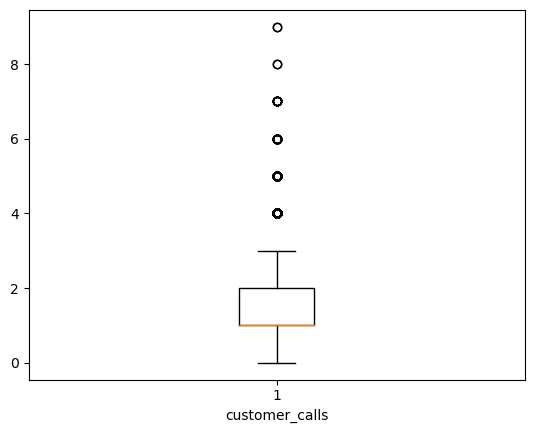

In [18]:
for column in numerical_columns:
  plt.boxplot(df[column])
  plt.xlabel(column)
  plt.show()

In [19]:
for column in numerical_columns:
  q3 = np.percentile(df[column],75)
  q1 = np.percentile(df[column],25)
  iqr = q3-q1
  ub = q3+1.5*iqr
  lb = q1-1.5*iqr
  df[column][df[column]>ub] = ub
  df[column][df[column]<lb] = lb

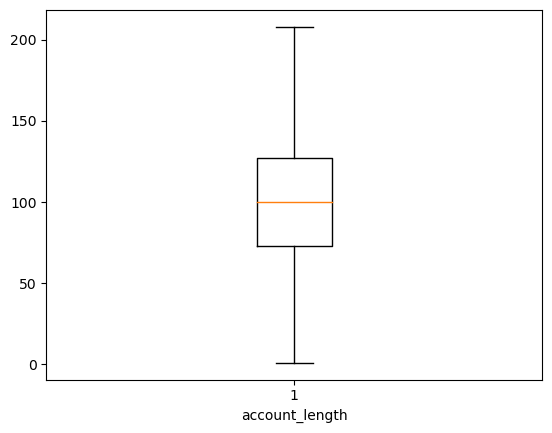

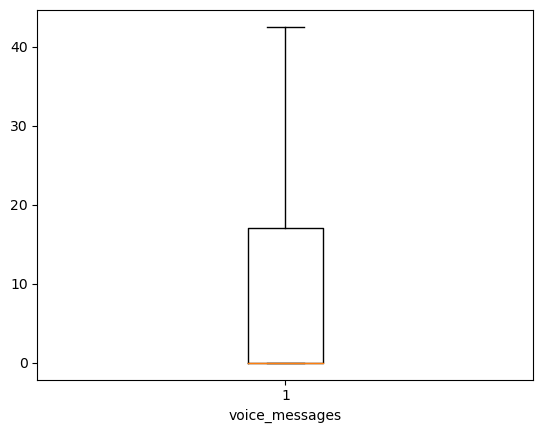

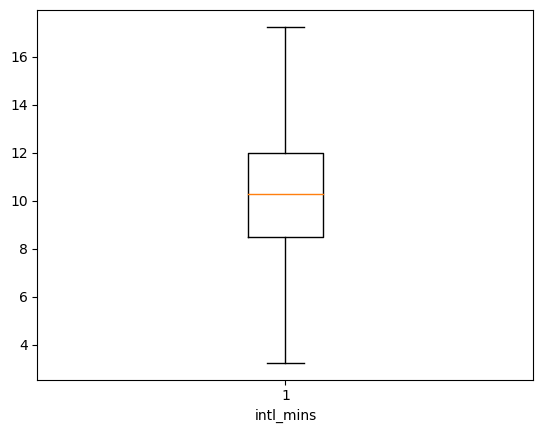

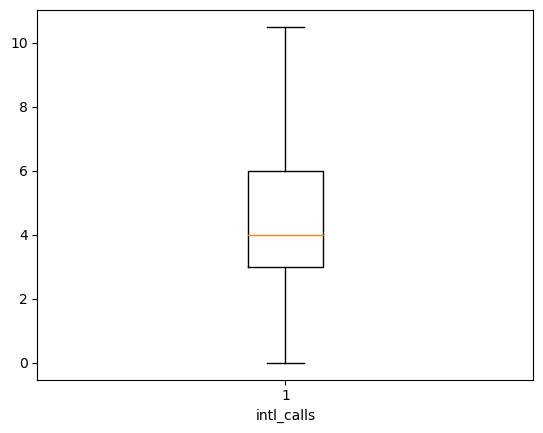

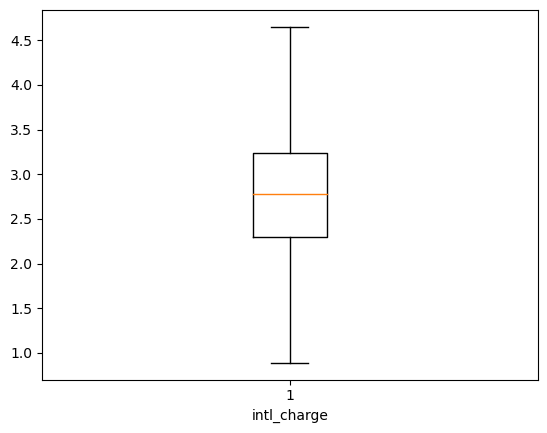

...

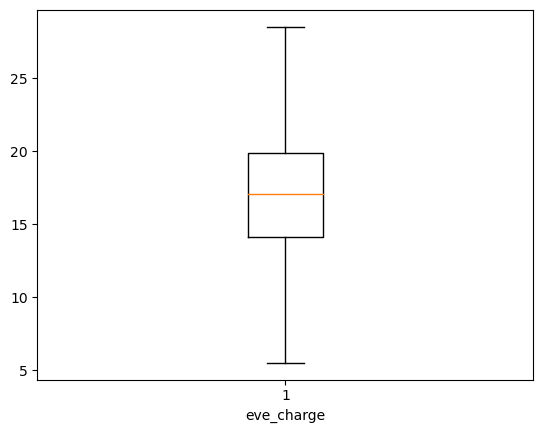

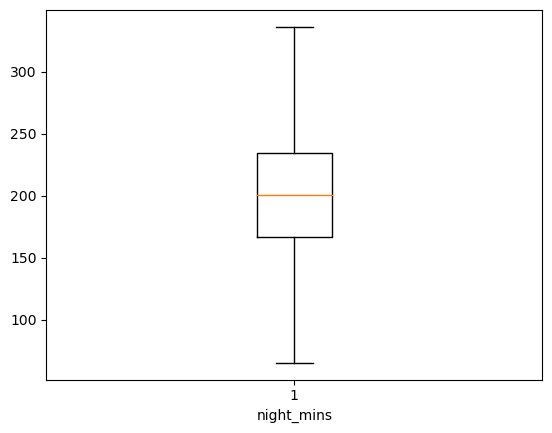

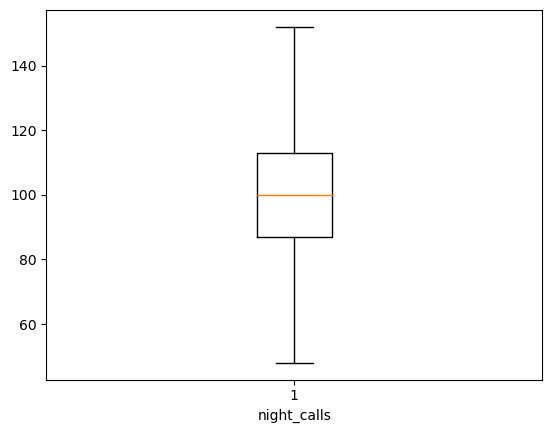

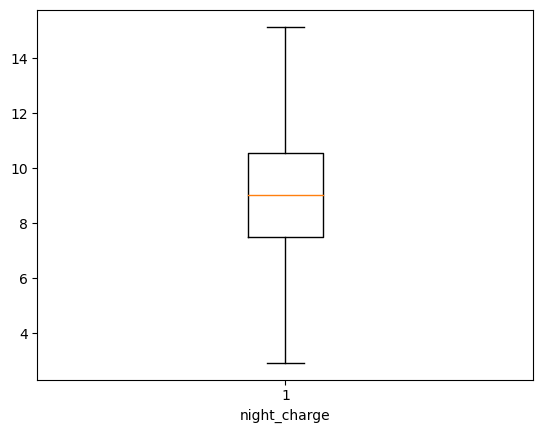

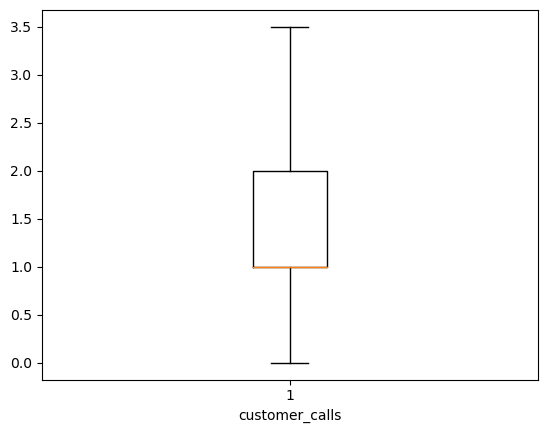

In [20]:
for column in numerical_columns:
  plt.boxplot(df[column])
  plt.xlabel(column)
  plt.show()

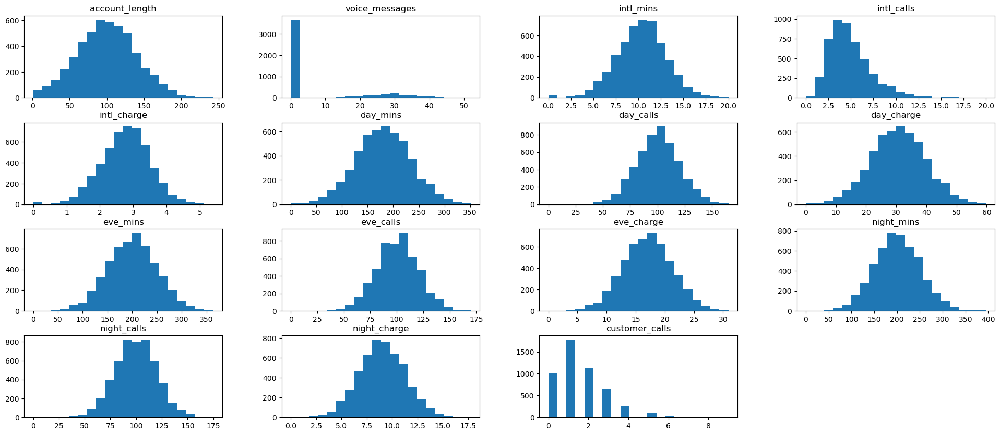

In [21]:
numerical_columns.hist(figsize=(24,10),bins=20,grid=False)
plt.show()

In [22]:
df["state"].unique()

array(['KS', 'OH', 'NJ', 'OK', 'AL', 'MA', 'MO', 'LA', 'WV', 'IN', 'RI',
       'IA', 'MT', 'NY', 'ID', 'VT', 'VA', 'TX', 'FL', 'CO', 'AZ', 'SC',
       'NE', 'WY', 'HI', 'IL', 'NH', 'GA', 'AK', 'MD', 'AR', 'WI', 'OR',
       'MI', 'DE', 'UT', 'CA', 'MN', 'SD', 'NC', 'WA', 'NM', 'NV', 'DC',
       'KY', 'ME', 'MS', 'TN', 'PA', 'CT', 'ND'], dtype=object)

<Axes: xlabel='index', ylabel='counts'>

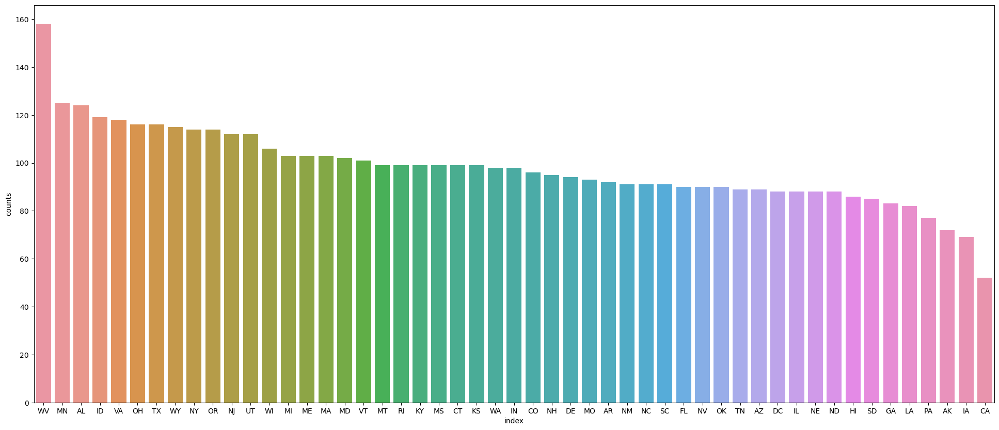

In [23]:
df1= df["state"].value_counts().reset_index(name="counts")
plt.figure(figsize=(24,10))
sns.barplot(x=df1["index"],y=df1["counts"])

In [24]:
df["area_code"].unique()

array(['area_code_415', 'area_code_408', 'area_code_510'], dtype=object)

<Axes: xlabel='index', ylabel='counts'>

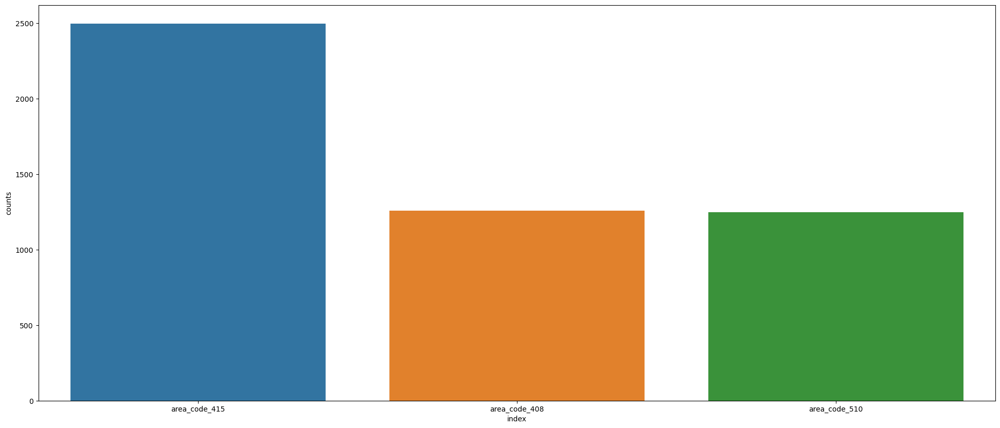

In [25]:
df2= df["area_code"].value_counts().reset_index(name="counts")
plt.figure(figsize=(24,10))
sns.barplot(x=df2["index"],y=df2["counts"])

In [26]:
df[df['churn']=='yes']['state'].value_counts().head()

NJ    28
TX    26
WA    24
WV    22
MT    21
Name: state, dtype: int64

In [27]:
df[df['churn']=='no']['state'].value_counts().head()

WV    136
VA    112
AL    111
MN    105
ID    105
Name: state, dtype: int64

<Axes: xlabel='state', ylabel='count'>

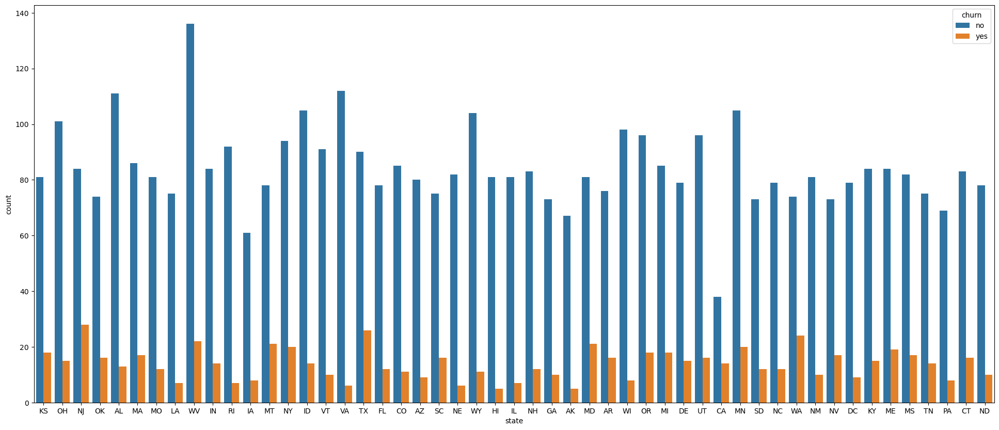

In [28]:
plt.figure(figsize=(24,10))
sns.countplot(x='state',hue='churn',data=df)

<Axes: xlabel='area_code', ylabel='count'>

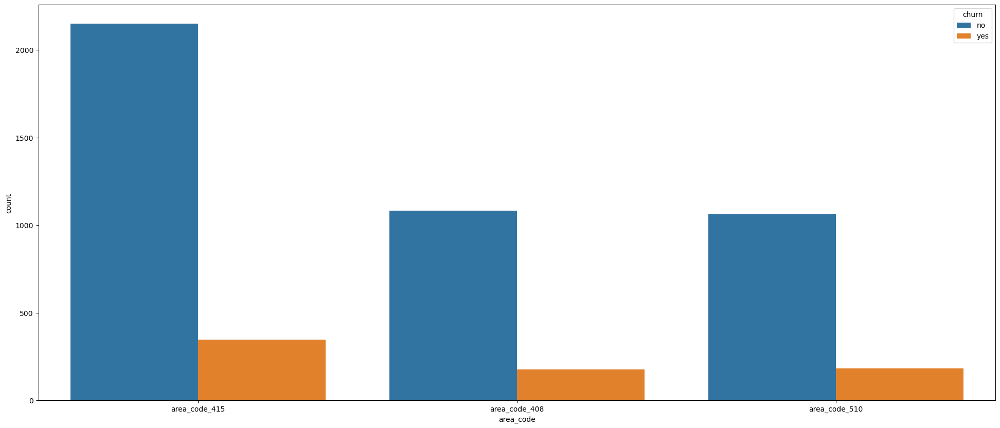

In [29]:
plt.figure(figsize=(24,10))
sns.countplot(x='area_code',hue='churn',data=df)

<Axes: xlabel='voice_plan', ylabel='count'>

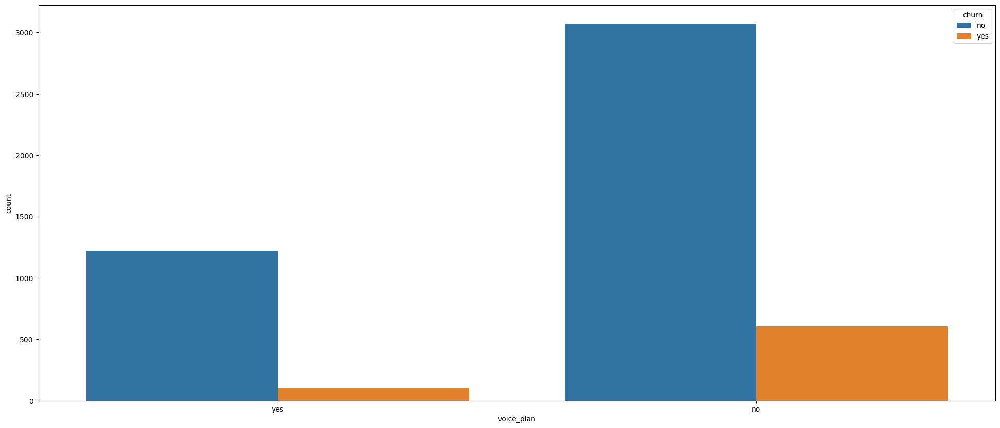

In [30]:
plt.figure(figsize=(24,10))
sns.countplot(x='voice_plan',hue='churn',data=df)

<Axes: xlabel='churn', ylabel='count'>

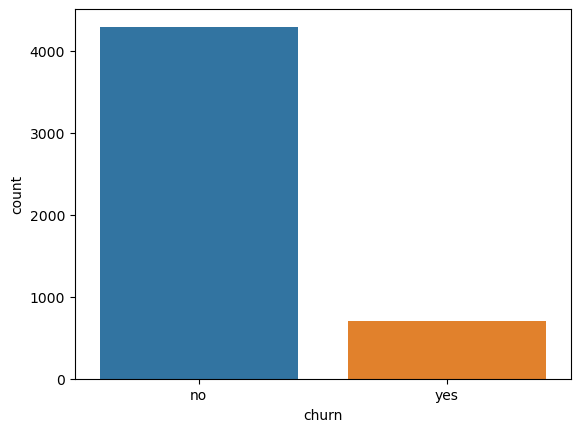

In [31]:
sns.countplot(x='churn',data=df)

## Preprocessing Data:

In [32]:
le = LabelEncoder()
for column in df.columns:
  if df[column].dtype=='object':
    df[column]=le.fit_transform(df[column])

In [33]:
df.dtypes

state               int32
area_code           int32
account_length      int64
voice_plan          int32
voice_messages    float64
intl_plan           int32
intl_mins         float64
intl_calls        float64
intl_charge       float64
day_mins          float64
day_calls           int64
day_charge        float64
eve_mins          float64
eve_calls         float64
eve_charge        float64
night_mins        float64
night_calls         int64
night_charge      float64
customer_calls    float64
churn               int32
dtype: object

In [34]:
df.head()

,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn
1,16,1,128,1,25.0,0,10.0,3.0,2.70,265.1,110,45.07,197.40,99.0,16.78,244.7,91,11.01,1.0,0
2,35,1,107,1,26.0,0,13.7,3.0,3.70,161.6,123,27.47,195.50,103.0,16.62,254.4,103,11.45,1.0,0
3,31,1,137,0,0.0,0,12.2,5.0,3.29,243.4,114,41.38,121.20,110.0,10.30,162.6,104,7.32,0.0,0
4,35,0,84,0,0.0,1,6.6,7.0,1.78,299.4,71,50.90,65.65,88.0,5.50,196.9,89,8.86,2.0,0
5,36,1,75,0,0.0,1,10.1,3.0,2.73,166.7,113,28.34,148.30,122.0,12.61,186.9,121,8.41,3.0,0


In [35]:
df.describe()

,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn
count,5000.00000,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,25.99840,0.99740,100.198200,0.264600,7.720200,0.094600,10.275920,4.380400,2.775074,180.31746,100.059200,30.658292,200.609450,100.203500,17.056592,200.364500,99.920600,9.016507,1.486300,0.141400
std,14.80348,0.70788,39.515136,0.441164,13.450126,0.292691,2.683608,2.264779,0.724116,53.61514,19.635173,9.112186,50.036315,19.700161,4.265047,50.086442,19.735455,2.253853,1.106575,0.348469
min,0.00000,0.00000,1.000000,0.000000,0.000000,0.000000,3.250000,0.000000,0.890000,34.95000,48.000000,5.950000,65.650000,46.500000,5.500000,65.200000,48.000000,2.935000,0.000000,0.000000
25%,13.00000,0.00000,73.000000,0.000000,0.000000,0.000000,8.500000,3.000000,2.300000,143.70000,87.000000,24.430000,166.600000,87.000000,14.140000,166.900000,87.000000,7.510000,1.000000,0.000000
50%,26.00000,1.00000,100.000000,0.000000,0.000000,0.000000,10.300000,4.000000,2.780000,180.10000,100.000000,30.620000,201.000000,100.000000,17.090000,200.400000,100.000000,9.020000,1.000000,0.000000
75%,39.00000,1.00000,127.000000,1.000000,17.000000,0.000000,12.000000,6.000000,3.240000,216.20000,113.000000,36.750000,233.900000,114.000000,19.900000,234.700000,113.000000,10.560000,2.000000,0.000000
max,50.00000,2.00000,208.000000,1.000000,42.500000,1.000000,17.250000,10.500000,4.650000,324.95000,152.000000,55.230000,334.850000,154.500000,28.540000,336.400000,152.000000,15.135000,3.500000,1.000000


In [36]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
state,5000.0,25.998400,14.803480,0.000,13.00,26.00,39.00,50.000
area_code,5000.0,0.997400,0.707880,0.000,0.00,1.00,1.00,2.000
account_length,5000.0,100.198200,39.515136,1.000,73.00,100.00,127.00,208.000
voice_plan,5000.0,0.264600,0.441164,0.000,0.00,0.00,1.00,1.000
voice_messages,5000.0,7.720200,13.450126,0.000,0.00,0.00,17.00,42.500
intl_plan,5000.0,0.094600,0.292691,0.000,0.00,0.00,0.00,1.000
intl_mins,5000.0,10.275920,2.683608,3.250,8.50,10.30,12.00,17.250
intl_calls,5000.0,4.380400,2.264779,0.000,3.00,4.00,6.00,10.500
intl_charge,5000.0,2.775074,0.724116,0.890,2.30,2.78,3.24,4.650
day_mins,5000.0,180.317460,53.615140,34.950,143.70,180.10,216.20,324.950


After viewing the basic statistical details of the data. We can observe that:

The average number of minutes a person is talking on the phone in day, evening and night is almost same.

The average number of calls made during the day, evening and night is almost same.

Again, the day charges are higher as compared to the evening and the night charges.

We can draw a conclusion here that Day, Evening and night charges are in the ratio 4:2:1.

## Checking Duplicated values:

In [37]:
df.duplicated().sum()

0

In [38]:
df[df.duplicated()]

,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn


As we can see above there are no duplicate values are present in the given dataset.

## Correlation Matrix:

In [39]:
df.corr()

,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn
state,1.000000,0.011491,0.009840,-0.030075,-0.027594,0.007422,-0.007522,0.011611,-0.007503,0.007949,-0.006766,0.007966,0.004425,-0.005915,0.004676,0.008968,-0.002479,0.008963,-0.012634,0.006946
area_code,0.011491,1.000000,-0.023681,0.004125,0.002697,0.029187,0.009518,-0.003501,0.009423,-0.000263,-0.004163,-0.000674,0.001782,-0.013360,0.001263,0.015953,0.018471,0.015950,0.015532,0.007167
account_length,0.009840,-0.023681,1.000000,-0.006096,-0.014436,0.014965,0.003942,0.015809,0.003984,-0.001026,0.028725,-0.000807,-0.009087,0.009036,-0.009988,-0.000386,-0.008796,-0.000397,-0.005526,0.021165
voice_plan,-0.030075,0.004125,-0.006096,1.000000,0.957001,0.009054,0.002637,-0.012867,0.002660,0.002308,-0.002201,0.002060,0.022697,-0.006726,0.023048,0.005008,0.009145,0.005004,-0.019003,-0.110698
voice_messages,-0.027594,0.002697,-0.014436,0.957001,1.000000,0.011781,0.001031,-0.005266,0.001043,0.005516,0.000145,0.005278,0.019330,-0.005126,0.019966,0.005328,0.002079,0.005320,-0.011524,-0.098087
intl_plan,0.007422,0.029187,0.014965,0.009054,0.011781,1.000000,0.031106,0.003944,0.031043,0.027861,0.007762,0.027736,0.019334,0.002246,0.020651,-0.026961,0.005803,-0.026963,-0.016379,0.259123
intl_mins,-0.007522,0.009518,0.003942,0.002637,0.001031,0.031106,1.000000,0.011303,0.999991,-0.020582,0.012945,-0.020376,-0.000431,-0.007559,-0.000026,-0.007256,0.000194,-0.007253,-0.013309,0.062425
intl_calls,0.011611,-0.003501,0.015809,-0.012867,-0.005266,0.003944,0.011303,1.000000,0.011302,-0.000177,0.008074,-0.000491,0.008039,0.005622,0.008459,-0.014280,0.002166,-0.014249,-0.009913,-0.052581
intl_charge,-0.007503,0.009423,0.003984,0.002660,0.001043,0.031043,0.999991,0.011302,1.000000,-0.020493,0.013028,-0.020287,-0.000431,-0.007626,-0.000029,-0.007165,0.000167,-0.007162,-0.013387,0.062393
day_mins,0.007949,-0.000263,-0.001026,0.002308,0.005516,0.027861,-0.020582,-0.000177,-0.020493,1.000000,-0.000653,0.999766,-0.009987,0.008855,-0.009890,0.010454,0.004289,0.010438,0.005376,0.207142


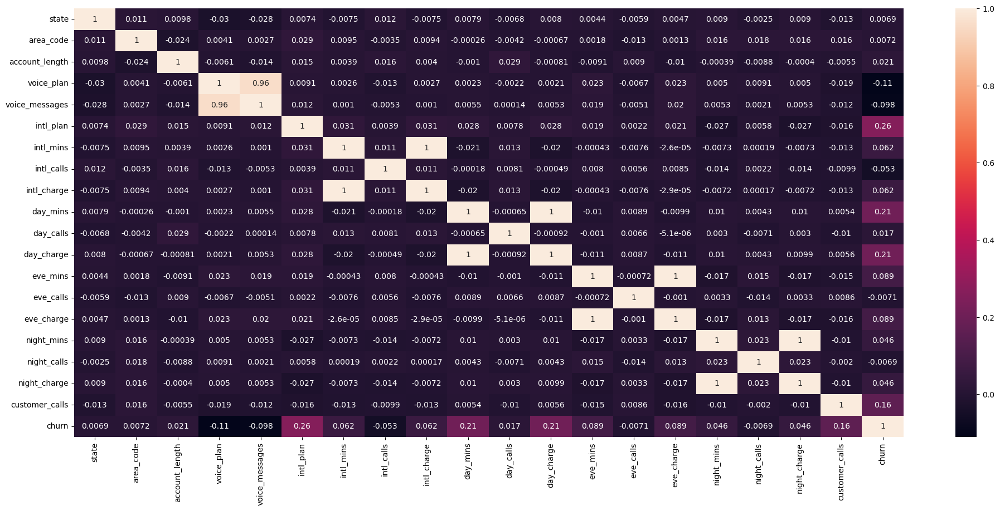

In [40]:
plt.figure(figsize=(24,10))
sns.heatmap(df.corr(),annot=True)
plt.show()

In [41]:
df.corr().abs().unstack().sort_values(ascending=False).head(30)

state           state             1.000000
day_calls       day_calls         1.000000
voice_plan      voice_plan        1.000000
voice_messages  voice_messages    1.000000
intl_plan       intl_plan         1.000000
intl_mins       intl_mins         1.000000
intl_calls      intl_calls        1.000000
intl_charge     intl_charge       1.000000
day_mins        day_mins          1.000000
day_charge      day_charge        1.000000
area_code       area_code         1.000000
eve_mins        eve_mins          1.000000
eve_calls       eve_calls         1.000000
eve_charge      eve_charge        1.000000
night_mins      night_mins        1.000000
night_calls     night_calls       1.000000
night_charge    night_charge      1.000000
customer_calls  customer_calls    1.000000
account_length  account_length    1.000000
churn           churn             1.000000
night_charge    night_mins        0.999999
night_mins      night_charge      0.999999
intl_charge     intl_mins         0.999991
intl_mins  

Text(0, 0.5, 'night_mins')

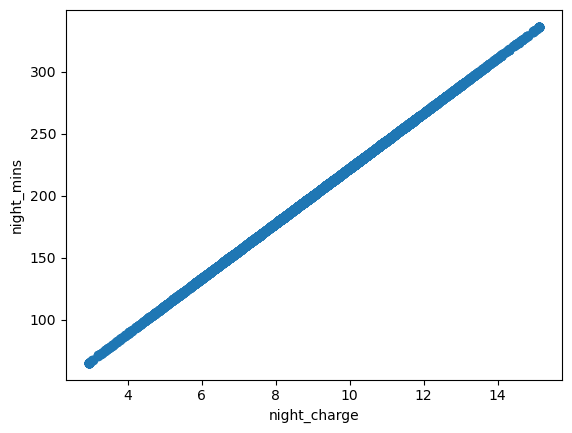

In [42]:
plt.scatter(df['night_charge'],df['night_mins'])
plt.xlabel("night_charge")
plt.ylabel('night_mins')

Text(0, 0.5, 'intl_mins')

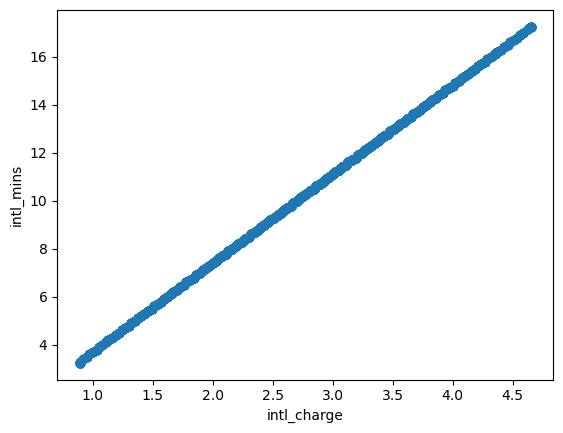

In [43]:
plt.scatter(df['intl_charge'],df['intl_mins'])
plt.xlabel("intl_charge")
plt.ylabel('intl_mins')

Text(0, 0.5, 'eve_mins')

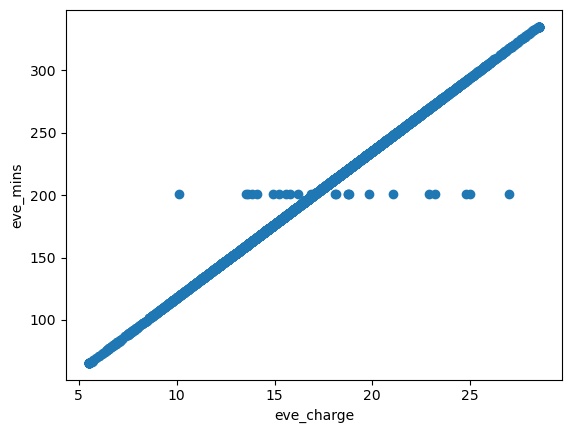

In [44]:
plt.scatter(df['eve_charge'],df['eve_mins'])
plt.xlabel("eve_charge")
plt.ylabel('eve_mins')

Text(0, 0.5, 'day_mins')

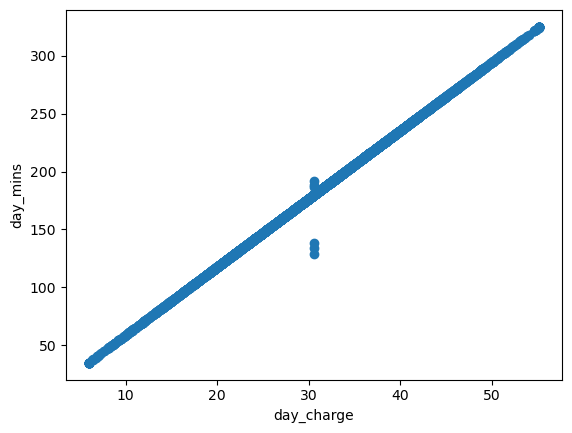

In [45]:
plt.scatter(df['day_charge'],df['day_mins'])
plt.xlabel("day_charge")
plt.ylabel('day_mins')

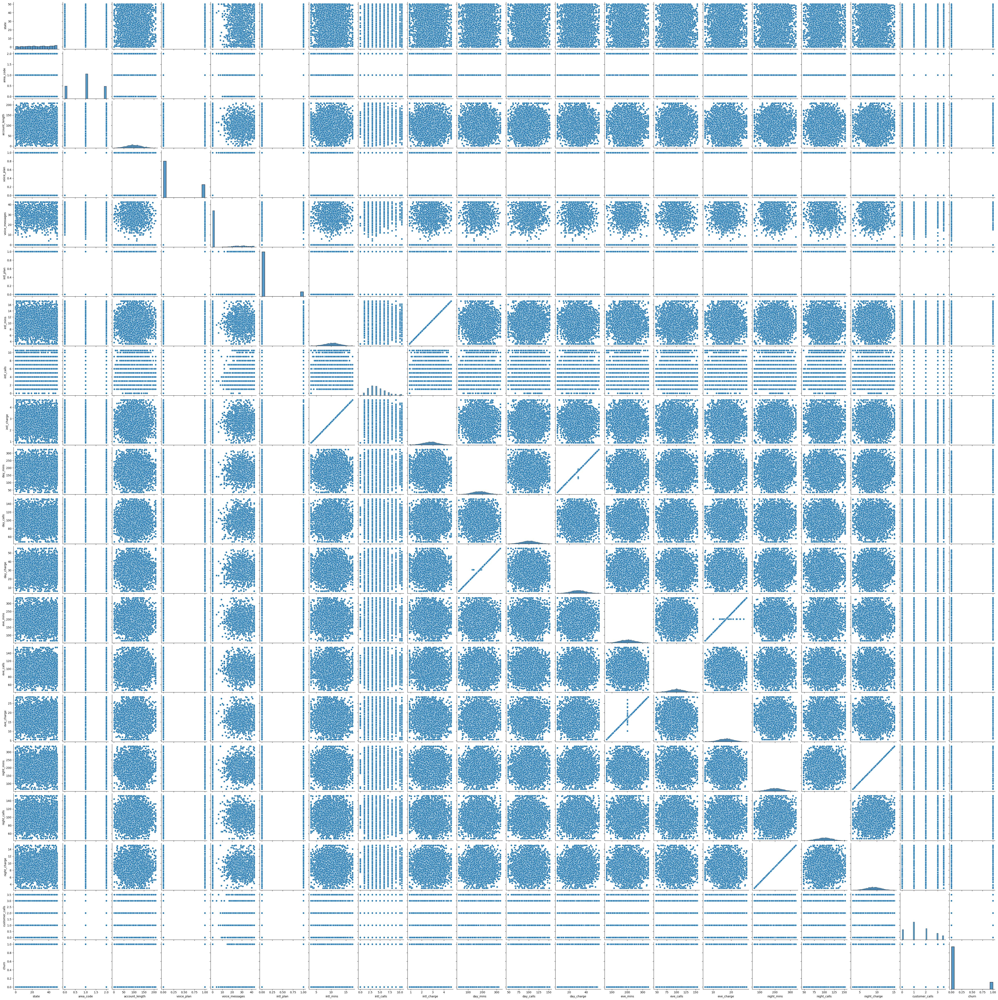

In [46]:
sns.pairplot(df)

## Data Visualization:

In [47]:
df['total_charge']=df['day_charge']+df['eve_charge']+df['night_charge']+df['intl_charge']

<Axes: xlabel='day_charge', ylabel='total_charge'>

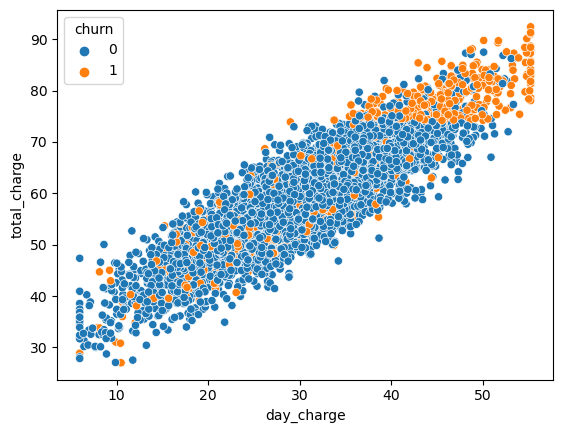

In [48]:
sns.scatterplot(x=df.day_charge, y=df.total_charge, hue=df.churn)

<Axes: xlabel='eve_charge', ylabel='total_charge'>

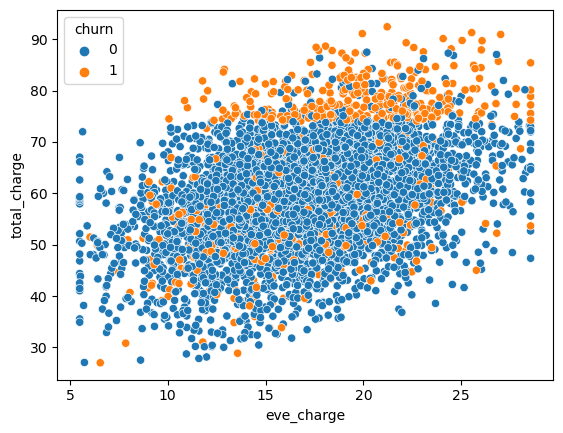

In [49]:
sns.scatterplot(x=df.eve_charge, y=df.total_charge, hue=df.churn)

<Axes: xlabel='night_charge', ylabel='total_charge'>

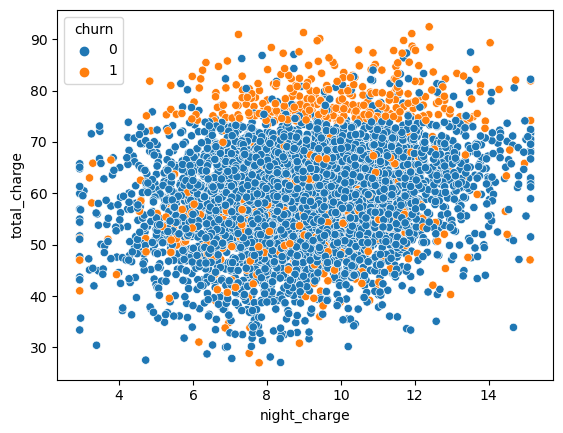

In [50]:
sns.scatterplot(x=df.night_charge, y=df.total_charge, hue=df.churn)

<Axes: xlabel='intl_charge', ylabel='total_charge'>

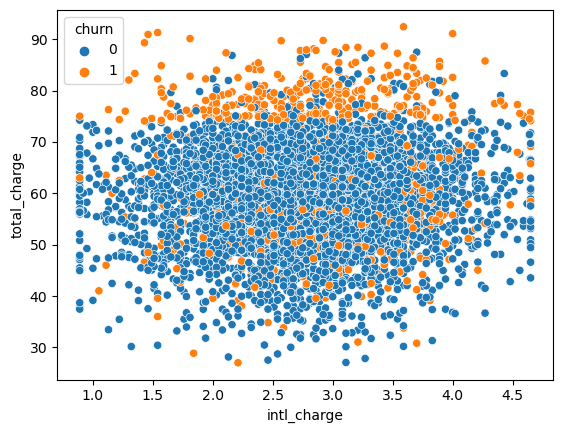

In [51]:
sns.scatterplot(x=df.intl_charge, y=df.total_charge, hue=df.churn)

By looking at the above plot we can observe that:

1.Day charges are highly postively related to the total charge.

2.Evening charges are less related to the total charge.

3.Night charges are the least which is related to the total charge.

<Axes: xlabel='churn', ylabel='total_charge'>

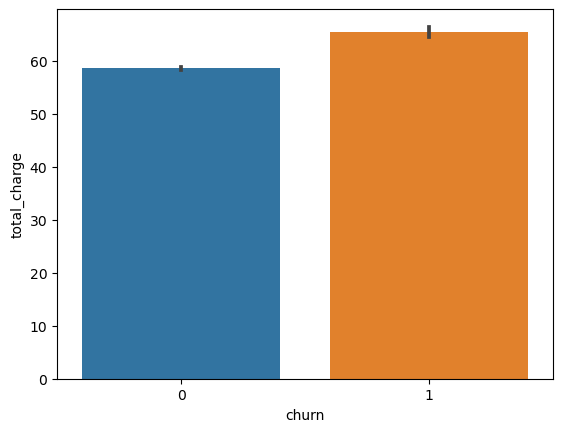

In [52]:
sns.barplot(x=df.churn, y=df.total_charge)

## Churn Vs Non-Churn:

<Axes: ylabel='churn'>

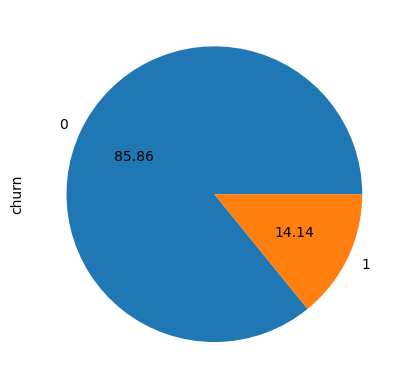

In [53]:
df.churn.value_counts().plot(kind="pie",autopct="%0.2f")

so, according to the above pie chart:
1. 85.86% are number of NO (Customer won't Churn)
2. 14.14% are number of YES (Customer will Churn)

<Axes: xlabel='churn', ylabel='account_length'>

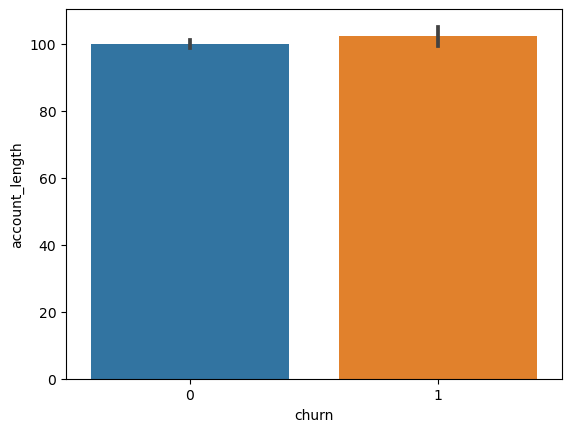

In [54]:
sns.barplot(x=df.churn, y=df.account_length)

<Axes: xlabel='voice_plan', ylabel='count'>

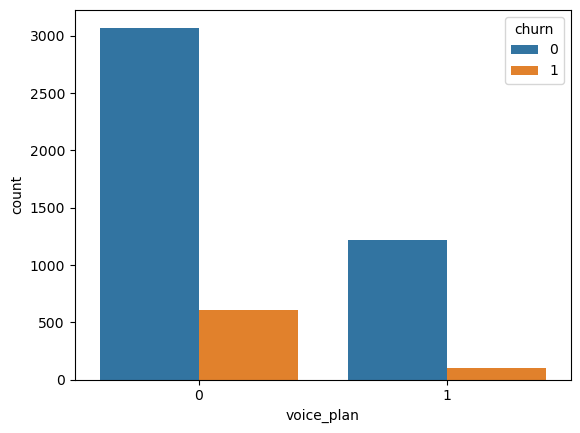

In [55]:
sns.countplot(x=df.voice_plan, hue='churn', data=df)

In [56]:
df[(df.voice_plan == 0) & (df.churn == 1)]

,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,...,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn,total_charge
11,15,1,65,0,0.0,0,12.7,6.0,3.43,129.10,...,21.95,228.50,83.0,19.42,208.8,111,9.40,3.5,1,54.20
16,34,1,161,0,0.0,0,5.4,9.0,1.46,324.95,...,55.23,317.80,97.0,27.01,160.6,128,7.23,3.5,1,90.93
22,5,0,77,0,0.0,0,5.7,6.0,1.54,62.40,...,10.61,169.90,121.0,14.44,209.6,64,9.43,3.5,1,36.02
34,3,0,12,0,0.0,0,11.8,3.0,3.19,249.60,...,42.43,252.40,119.0,21.45,280.2,90,12.61,1.0,1,79.68
49,13,1,119,0,0.0,0,8.8,3.0,2.38,159.10,...,27.05,231.30,117.0,19.66,143.2,91,6.44,3.5,1,55.53
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4960,32,0,137,0,0.0,1,10.6,2.0,2.86,312.40,...,53.11,231.10,73.0,19.64,120.1,78,5.40,1.0,1,81.01
4981,47,0,73,0,0.0,0,12.3,2.0,3.32,177.20,...,30.12,270.50,84.0,22.99,241.8,112,10.88,3.0,1,67.31
4991,28,2,140,0,0.0,0,7.5,6.0,2.03,244.70,...,41.60,258.60,101.0,21.98,231.3,112,10.41,1.0,1,76.02
4992,3,2,97,0,0.0,0,8.8,5.0,2.38,252.60,...,42.94,334.85,91.0,28.54,256.5,67,11.54,1.0,1,85.40


In [57]:
#those who have taken voice mail plan and are churning are less no of customers:

df[(df.voice_plan == 1) & (df.churn == 1)]

,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,...,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn,total_charge
42,20,0,135,1,41.0,1,14.60,10.5,3.94,173.1,...,29.43,203.9,107.0,17.33,122.2,78,5.50,0.0,1,56.20
58,5,0,121,1,30.0,0,5.80,3.0,1.57,198.4,...,33.73,75.3,77.0,6.40,181.2,77,8.15,3.0,1,49.85
116,21,2,36,1,42.0,1,17.25,6.0,4.65,196.8,...,33.46,254.9,122.0,21.67,138.3,126,6.22,0.0,1,66.00
128,25,2,61,1,27.0,0,6.40,6.0,1.73,187.5,...,31.88,146.6,103.0,12.46,225.7,129,10.16,3.5,1,56.23
199,21,2,131,1,26.0,1,13.80,7.0,3.73,292.9,...,49.79,199.7,97.0,16.97,255.3,127,11.49,3.5,1,81.98
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4637,31,1,136,1,22.0,1,11.70,2.0,3.16,160.3,...,27.25,273.2,88.0,23.22,203.2,89,9.14,0.0,1,62.77
4677,12,1,200,1,29.0,1,5.70,1.0,1.54,92.2,...,15.67,200.0,101.0,17.00,119.1,99,5.36,1.0,1,39.57
4774,26,1,84,1,25.0,0,12.90,8.0,3.48,113.9,...,19.36,257.0,99.0,21.85,214.5,98,9.65,3.5,1,54.34
4779,34,0,102,1,42.5,0,7.80,4.0,2.11,134.0,...,22.78,234.3,128.0,19.92,197.3,107,8.88,3.5,1,53.69


Text(0.5, 1.0, 'Total calls')

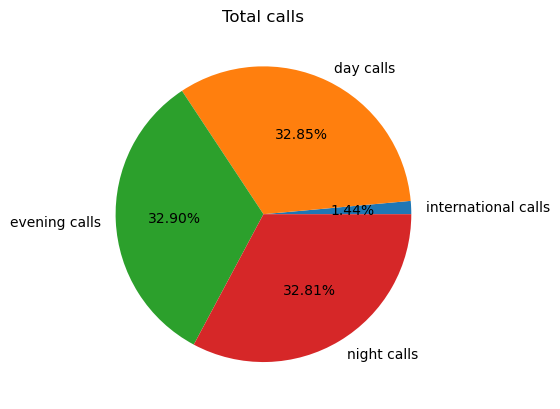

In [58]:
#Total Calls:

calls=np.array([df['intl_calls'].sum(),df['day_calls'].sum(),df['eve_calls'].sum(),df['night_calls'].sum()])
plt.pie(calls,labels=['international calls','day calls','evening calls','night calls'],autopct='%0.2f%%')
plt.title('Total calls')

Text(0.5, 1.0, 'Total charge')

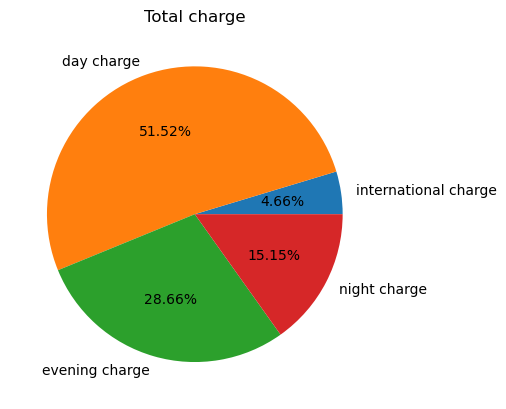

In [59]:
#Total Charge:

charge=np.array([df['intl_charge'].sum(),df['day_charge'].sum(),df['eve_charge'].sum(),df['night_charge'].sum()])
plt.pie(charge,labels=['international charge','day charge','evening charge','night charge'],autopct='%0.2f%%')
plt.title('Total charge')

Text(0.5, 1.0, 'Total minutes')

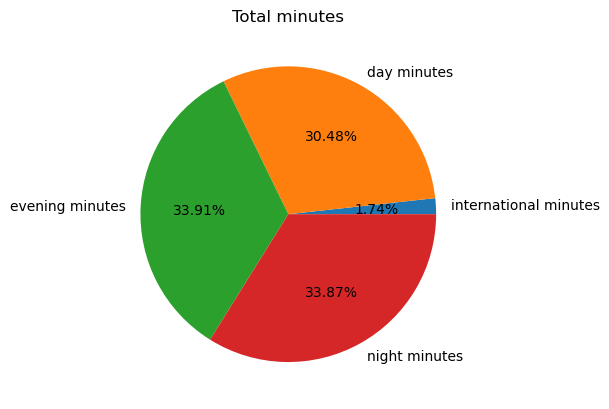

In [60]:
#Total mins:

mins=np.array([df['intl_mins'].sum(),df['day_mins'].sum(),df['eve_mins'].sum(),df['night_mins'].sum()])
plt.pie(mins,labels=['international minutes','day minutes','evening minutes','night minutes'],autopct='%0.2f%%')
plt.title('Total minutes')

In [61]:
from sklearn.preprocessing import StandardScaler

In [62]:
sc=StandardScaler()

In [63]:
x=df.drop(columns=['churn'])
y=df['churn']

In [64]:
sc.fit_transform(x)

array([[-0.6754763 ,  0.00367331,  0.7036438 , ...,  0.88457087,
        -0.43950825,  1.56094391],
       [ 0.60813405,  0.00367331,  0.17214872, ...,  1.07981167,
        -0.43950825, -0.02590937],
       [ 0.33790029,  0.00367331,  0.9314274 , ..., -0.75278953,
        -1.34328832,  0.27065329],
       ...,
       [-1.28350225,  0.00367331, -0.99207858, ...,  0.24116366,
        -0.43950825, -0.7473831 ],
       [-1.28350225,  1.41648431,  0.2227673 , ...,  0.48077738,
        -1.34328832, -0.04049441],
       [ 1.35127687,  0.00367331, -0.35934635, ..., -0.90809472,
        -1.34328832, -0.51791167]])

## Feature Selection:

In [65]:
!pip install yellowbrick
from sklearn.feature_selection import SelectKBest, chi2 ,f_classif, RFE,mutual_info_classif
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from yellowbrick.model_selection import rfecv

## Univariate selection:

In [66]:
#chi2
test  = SelectKBest(score_func=chi2,k=10)
test_fit=test.fit(x,y)
d={"column":x.columns,"scores":test_fit.scores_}
chi2=pd.DataFrame(d)
chi2.sort_values("scores",ascending=False)

,column,scores
9,day_mins,3419.438136
4,voice_messages,1127.015169
11,day_charge,580.166206
19,total_charge,489.292288
12,eve_mins,488.892773
5,intl_plan,303.963357
15,night_mins,132.451969
18,customer_calls,103.570015
3,voice_plan,45.058340
14,eve_charge,41.927232


In [67]:
print(x.columns[test.get_support()])

Index(['voice_plan', 'voice_messages', 'intl_plan', 'day_mins', 'day_charge',
       'eve_mins', 'eve_charge', 'night_mins', 'customer_calls',
       'total_charge'],
      dtype='object')


In [68]:
#anova
test1 = SelectKBest(score_func=f_classif,k=10)
test1_fit=test1.fit(x,y)
df1={"column":x.columns,"scores":test_fit.scores_}
anova=pd.DataFrame(d)
anova.sort_values("scores",ascending=False)

,column,scores
9,day_mins,3419.438136
4,voice_messages,1127.015169
11,day_charge,580.166206
19,total_charge,489.292288
12,eve_mins,488.892773
5,intl_plan,303.963357
15,night_mins,132.451969
18,customer_calls,103.570015
3,voice_plan,45.058340
14,eve_charge,41.927232


In [69]:
test1.get_feature_names_out()

array(['voice_plan', 'voice_messages', 'intl_plan', 'intl_mins',
       'day_mins', 'day_charge', 'eve_mins', 'eve_charge',
       'customer_calls', 'total_charge'], dtype=object)

## Recursive Feature Elimination with Logistic Regression:

In [70]:
rfe = RFE(LogisticRegression())
rfe.fit(x,y)

RFE(estimator=LogisticRegression())

In [71]:
rfe.ranking_

array([ 4,  1,  6,  1,  1,  1,  7,  1,  1,  3,  5,  1,  9,  1,  1, 10,  2,
       11,  1,  8])

In [72]:
rfe.get_feature_names_out()

array(['area_code', 'voice_plan', 'voice_messages', 'intl_plan',
       'intl_calls', 'intl_charge', 'day_charge', 'eve_calls',
       'eve_charge', 'customer_calls'], dtype=object)

In [73]:
rfe1={"column":x.columns,"Ranks":rfe.ranking_}
rfedf=pd.DataFrame(rfe1)
rfedf.sort_values("Ranks")

,column,Ranks
1,area_code,1
3,voice_plan,1
4,voice_messages,1
5,intl_plan,1
14,eve_charge,1
7,intl_calls,1
8,intl_charge,1
18,customer_calls,1
13,eve_calls,1
11,day_charge,1


## Recursive Feature Elimination with Decision Tree:

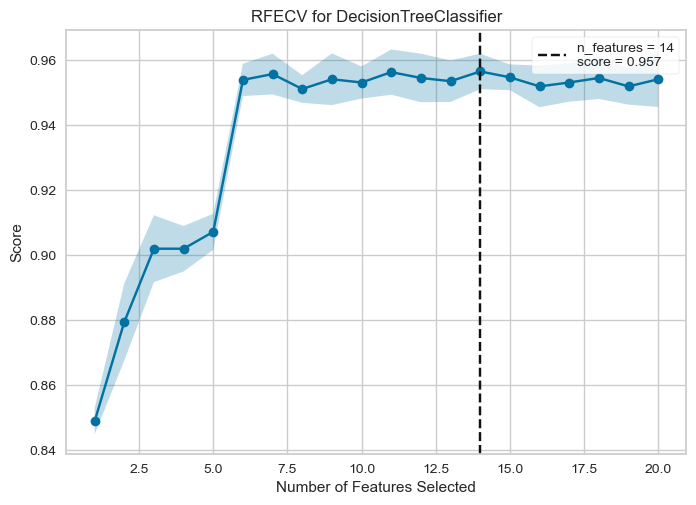

In [74]:
rfe2 = rfecv(DecisionTreeClassifier(),x,y)

In [75]:
rfe2.ranking_

array([1, 7, 1, 6, 1, 1, 1, 1, 1, 5, 1, 1, 1, 4, 2, 3, 1, 1, 1, 1])

In [76]:
rfe2.get_feature_names_out()

array(['x0', 'x2', 'x4', 'x5', 'x6', 'x7', 'x8', 'x10', 'x11', 'x12',
       'x16', 'x17', 'x18', 'x19'], dtype=object)

In [77]:
rfe2={"column":x.columns,"Ranks":rfe2.ranking_}
rfecvdf=pd.DataFrame(rfe2)
rfecvdf.sort_values("Ranks")

,column,Ranks
0,state,1
17,night_charge,1
16,night_calls,1
12,eve_mins,1
11,day_charge,1
10,day_calls,1
18,customer_calls,1
8,intl_charge,1
19,total_charge,1
6,intl_mins,1


## Tree Based Method:

In [78]:
dt = DecisionTreeClassifier()

dt.fit(x,y)

DecisionTreeClassifier()

In [79]:
dt.feature_importances_

array([0.01148733, 0.0052935 , 0.01141037, 0.00109824, 0.11069219,
       0.06866092, 0.09044044, 0.08005581, 0.0108784 , 0.0042081 ,
       0.00582061, 0.0084981 , 0.01517513, 0.00782328, 0.00604916,
       0.00698273, 0.01885424, 0.00800724, 0.11046245, 0.41810174])

In [80]:
dt={"column":x.columns,"Imp":dt.feature_importances_}
dtdf=pd.DataFrame(dt)
dtdf.sort_values("Imp",ascending=False)

,column,Imp
19,total_charge,0.418102
4,voice_messages,0.110692
18,customer_calls,0.110462
6,intl_mins,0.090440
7,intl_calls,0.080056
5,intl_plan,0.068661
16,night_calls,0.018854
12,eve_mins,0.015175
0,state,0.011487
2,account_length,0.011410


In [81]:
df.drop('area_code',axis=1,inplace=True)

In [82]:
df.columns

Index(['state', 'account_length', 'voice_plan', 'voice_messages', 'intl_plan',
       'intl_mins', 'intl_calls', 'intl_charge', 'day_mins', 'day_calls',
       'day_charge', 'eve_mins', 'eve_calls', 'eve_charge', 'night_mins',
       'night_calls', 'night_charge', 'customer_calls', 'churn',
       'total_charge'],
      dtype='object')

# Balancing


In [83]:
from imblearn.under_sampling import RandomUnderSampler
from collections import Counter

# Assuming you have your data loaded or defined as X and y
# For example:
# X = your_feature_data
# y = your_target_data
#X=df.drop(columns=['churn'])
#y=df['churn']

# Instantiate RandomUnderSampler
rs = RandomUnderSampler(random_state=42)

# Apply random under-sampling
x_res, y_res = rs.fit_resample(x, y)

# Print information about the undersampled dataset
print('After undersample dataset shape:', Counter(y_res))


After undersample dataset shape: Counter({0: 707, 1: 707})


In [86]:
from imblearn.under_sampling import RandomUnderSampler

# Create a RandomUnderSampler object
rs = RandomUnderSampler(random_state=42)
x=df.drop(columns=['churn'])
y=df['churn']

# Fit the RandomUnderSampler to the training data
rs.fit(x,y)

# Resample the training data
x_res, y_res = rs.fit_resample(x,y)

# Print the shape of the resampled data
print('After undersample dataset shape:', x_res.shape, y_res.shape)

After undersample dataset shape: (1414, 19) (1414,)


In [87]:
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification
from collections import Counter

# Generate a synthetic imbalanced dataset for demonstration purposes
x, y = make_classification(n_classes=2, class_sep=2, weights=[0.1, 0.9],
                           n_informative=3, n_redundant=1, flip_y=0,
                           n_features=20, n_clusters_per_class=1,
                           n_samples=1000, random_state=42)

# Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Display the class distribution before oversampling
print('Class distribution before oversampling:', Counter(y_train))

# Instantiate RandomOverSampler
ros = RandomOverSampler(random_state=42)

# Apply RandomOverSampler to the training data only
x_resampled, y_resampled = ros.fit_resample(x_train, y_train)

# Display the class distribution after oversampling
print('Class distribution after oversampling:', Counter(y_resampled))


Class distribution before oversampling: Counter({1: 713, 0: 87})
Class distribution after oversampling: Counter({1: 713, 0: 713})


In [88]:
from imblearn.over_sampling import RandomOverSampler

# Create a RandomOverSampler object
rs = RandomUnderSampler(random_state=42)
x=df.drop(columns=['churn'])
y=df['churn']

# Fit the RandomOverSampler to the training data
rs.fit(x,y)

# Resample the training data
x_res, y_res = rs.fit_resample(x,y)

# Print the shape of the resampled data
print('After oversample dataset shape:', x_res.shape, y_res.shape)

After oversample dataset shape: (1414, 19) (1414,)


In [89]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification
from collections import Counter

# Generate a synthetic imbalanced dataset for demonstration purposes
x, y = make_classification(n_classes=2, class_sep=2, weights=[0.1, 0.9],
                           n_informative=3, n_redundant=1, flip_y=0,
                           n_features=20, n_clusters_per_class=1,
                           n_samples=1000, random_state=42)

# Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Display the class distribution before applying SMOTE
print('Class distribution before SMOTE:', Counter(y_train))

# Instantiate SMOTE
smote = SMOTE(random_state=42)

# Apply SMOTE to the training data only
x_resampled, y_resampled = smote.fit_resample(x_train, y_train)

# Display the class distribution after applying SMOTE
print('Class distribution after SMOTE:', Counter(y_resampled))


Class distribution before SMOTE: Counter({1: 713, 0: 87})
Class distribution after SMOTE: Counter({1: 713, 0: 713})


## Model Building:

In [90]:
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier, StackingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import classification_report,accuracy_score,confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

In [91]:
xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size=0.3, random_state=42)

In [92]:
train_accuracy=[]
test_accuracy=[]
def prediction(model):
    model.fit(xtrain,ytrain)
    ypred = model.predict(xtest)
    print(f"Train Accuracy: {model.score(xtrain,ytrain)} ")
    print(f"Test Accuracy :{model.score(xtest,ytest)}")
    train_accuracy.append(model.score(xtrain,ytrain))
    test_accuracy.append(model.score(xtest,ytest))
    print(classification_report(ytest,ypred))
    print(f"Confusion Matrix:{confusion_matrix(ytest,ypred)}")

## Logistic Regression:

In [93]:
le=LogisticRegression()
prediction(le)

Train Accuracy: 1.0 
Test Accuracy :1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        27
           1       1.00      1.00      1.00       273

    accuracy                           1.00       300
   macro avg       1.00      1.00      1.00       300
weighted avg       1.00      1.00      1.00       300

Confusion Matrix:[[ 27   0]
 [  0 273]]


## Decision Tree Classifier:

In [94]:
n = np.array(range(1,5))
params = dict(max_depth=n)

In [95]:
model = DecisionTreeClassifier()
grid = GridSearchCV(estimator=model, param_grid=params)
grid.fit(x,y)

GridSearchCV(estimator=DecisionTreeClassifier(),
             param_grid={'max_depth': array([1, 2, 3, 4])})

In [96]:
print(grid.best_score_)
print(grid.best_params_)

0.9970000000000001
{'max_depth': 1}


In [97]:
prediction(DecisionTreeClassifier(max_depth=4))

Train Accuracy: 1.0 
Test Accuracy :1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        27
           1       1.00      1.00      1.00       273

    accuracy                           1.00       300
   macro avg       1.00      1.00      1.00       300
weighted avg       1.00      1.00      1.00       300

Confusion Matrix:[[ 27   0]
 [  0 273]]


## Gradient Boosting:

In [98]:
params={'learning_rate':[0.1,0.01,0.001],'n_estimators':range(10,100,10)}

In [99]:
model = GradientBoostingClassifier()
grid = GridSearchCV(estimator=model, param_grid=params)
grid.fit(x,y)

GridSearchCV(estimator=GradientBoostingClassifier(),
             param_grid={'learning_rate': [0.1, 0.01, 0.001],
                         'n_estimators': range(10, 100, 10)})

In [100]:
print(grid.best_score_)
print(grid.best_params_)

0.9970000000000001
{'learning_rate': 0.1, 'n_estimators': 20}


In [101]:
prediction(GradientBoostingClassifier(learning_rate=0.1,n_estimators=70))

Train Accuracy: 1.0 
Test Accuracy :1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        27
           1       1.00      1.00      1.00       273

    accuracy                           1.00       300
   macro avg       1.00      1.00      1.00       300
weighted avg       1.00      1.00      1.00       300

Confusion Matrix:[[ 27   0]
 [  0 273]]


## Random Forest:

In [102]:
params={'max_depth':range(10,30,10),'n_estimators':range(100,300,100),'max_features':range(5,15,2),'bootstrap':[True,False]}

In [103]:
model = RandomForestClassifier()
grid = GridSearchCV(estimator=model, param_grid=params)
grid.fit(x,y)

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'bootstrap': [True, False],
                         'max_depth': range(10, 30, 10),
                         'max_features': range(5, 15, 2),
                         'n_estimators': range(100, 300, 100)})

In [104]:
print(grid.best_score_)
print(grid.best_params_)

0.999
{'bootstrap': True, 'max_depth': 10, 'max_features': 5, 'n_estimators': 100}


In [105]:
prediction(RandomForestClassifier(max_depth=10,n_estimators=100,max_features=5,bootstrap=True))

Train Accuracy: 1.0 
Test Accuracy :1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        27
           1       1.00      1.00      1.00       273

    accuracy                           1.00       300
   macro avg       1.00      1.00      1.00       300
weighted avg       1.00      1.00      1.00       300

Confusion Matrix:[[ 27   0]
 [  0 273]]


## Bagging Classifier:

In [106]:
prediction(BaggingClassifier())

Train Accuracy: 1.0 
Test Accuracy :1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        27
           1       1.00      1.00      1.00       273

    accuracy                           1.00       300
   macro avg       1.00      1.00      1.00       300
weighted avg       1.00      1.00      1.00       300

Confusion Matrix:[[ 27   0]
 [  0 273]]


## Stacking Classsifier:

In [107]:
models = []

models.append(('lg',LogisticRegression()))
models.append(('dt',DecisionTreeClassifier()))
models.append(('dt1', DecisionTreeClassifier(criterion='entropy')))

In [108]:
prediction(StackingClassifier(estimators=models, final_estimator=RandomForestClassifier(max_depth=3)))

Train Accuracy: 1.0 
Test Accuracy :1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        27
           1       1.00      1.00      1.00       273

    accuracy                           1.00       300
   macro avg       1.00      1.00      1.00       300
weighted avg       1.00      1.00      1.00       300

Confusion Matrix:[[ 27   0]
 [  0 273]]


# XGBoost:

In [109]:
params={'n_estimators':(1,100,10),'max_depth':range(1,5)}

In [110]:
model = XGBClassifier()
grid = GridSearchCV(estimator=model, param_grid=params)
grid.fit(x,y)

GridSearchCV(estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_bin=None,
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             param_grid={'max_depth': range(1, 5),
                         'n_estimators': (1, 100, 10)})

In [111]:
print(grid.best_score_)
print(grid.best_params_)

1.0
{'max_depth': 2, 'n_estimators': 100}


In [112]:
prediction(XGBClassifier(n_estimators=100,max_depth=4))

Train Accuracy: 1.0 
Test Accuracy :1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        27
           1       1.00      1.00      1.00       273

    accuracy                           1.00       300
   macro avg       1.00      1.00      1.00       300
weighted avg       1.00      1.00      1.00       300

Confusion Matrix:[[ 27   0]
 [  0 273]]


## KNN:

In [113]:
n = np.array(range(1,40)) # k value from 1 to 40
params = dict(n_neighbors=n)

In [114]:
model = KNeighborsClassifier()
grid = GridSearchCV(estimator=model, param_grid=params)
grid.fit(x,y)

GridSearchCV(estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39])})

In [115]:
print(grid.best_score_)
print(grid.best_params_)

0.9960000000000001
{'n_neighbors': 4}


In [116]:
prediction(KNeighborsClassifier(n_neighbors=9))

Train Accuracy: 0.9942857142857143 
Test Accuracy :0.99
              precision    recall  f1-score   support

           0       1.00      0.89      0.94        27
           1       0.99      1.00      0.99       273

    accuracy                           0.99       300
   macro avg       0.99      0.94      0.97       300
weighted avg       0.99      0.99      0.99       300

Confusion Matrix:[[ 24   3]
 [  0 273]]


## SVM:

In [117]:
prediction(SVC(kernel='rbf',C=100))

Train Accuracy: 1.0 
Test Accuracy :0.9966666666666667
              precision    recall  f1-score   support

           0       1.00      0.96      0.98        27
           1       1.00      1.00      1.00       273

    accuracy                           1.00       300
   macro avg       1.00      0.98      0.99       300
weighted avg       1.00      1.00      1.00       300

Confusion Matrix:[[ 26   1]
 [  0 273]]


In [118]:
models=['Logistic Regression','Desicion Tree','Gradient Boosting','Random Forest','Bagging','Stacking Classifier','XGBoost','KNN','SVM']
acc=pd.DataFrame({'Model':models,'Training Accuracy':train_accuracy,'Testing Accuracy':test_accuracy})
acc.sort_values('Testing Accuracy',ascending=False)

,Model,Training Accuracy,Testing Accuracy
0,Logistic Regression,1.000000,1.000000
1,Desicion Tree,1.000000,1.000000
2,Gradient Boosting,1.000000,1.000000
3,Random Forest,1.000000,1.000000
4,Bagging,1.000000,1.000000
5,Stacking Classifier,1.000000,1.000000
6,XGBoost,1.000000,1.000000
8,SVM,1.000000,0.996667
7,KNN,0.994286,0.990000
